# 資料探索

In [1]:
# 載入相關套件
from utils import *
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import datetime
import math
import random
import shutil

from typing import Dict, List


In [2]:
# 初始化繪布
set_default_figure()


In [3]:
# 載入資料
df_a, df_b, df_c, df_d, df_e, df_f = load_data('data')

# 把各場景資料放進 List
df_list = []
df_list.append(df_a)
df_list.append(df_b)
df_list.append(df_c)
df_list.append(df_d)
df_list.append(df_e)
df_list.append(df_f)

# 整個場景的 DataFrame
df_all = pd.concat([df_a, df_b, df_c, df_d, df_e, df_f], ignore_index=True)

In [4]:
# 取得今日日期
today = datetime.date.today().strftime('%Y%m%d')

# 設定目錄名稱 - 不同 test_size 差別
plot_type_name = 'eda'


In [5]:
# 工作區
workspace = os.path.join("./plot", today, plot_type_name)

try:
    shutil.rmtree(workspace)
except:
    pass

os.makedirs(workspace)

def getImageName(filename: str):
    """
    取得圖片檔保存路徑
    """
    return os.path.join( workspace, filename )
    

In [6]:
# 計算各場景人數資料
total_df = pd.DataFrame(columns=['Scenario', 'Counting'])

for df in df_list:
    rec = {'Scenario': df.iloc[0,-1], 
            'Counting': df.shape[0]}
    total_df = total_df.append(rec, ignore_index = True)
    
total_df.set_index('Scenario', inplace=True)


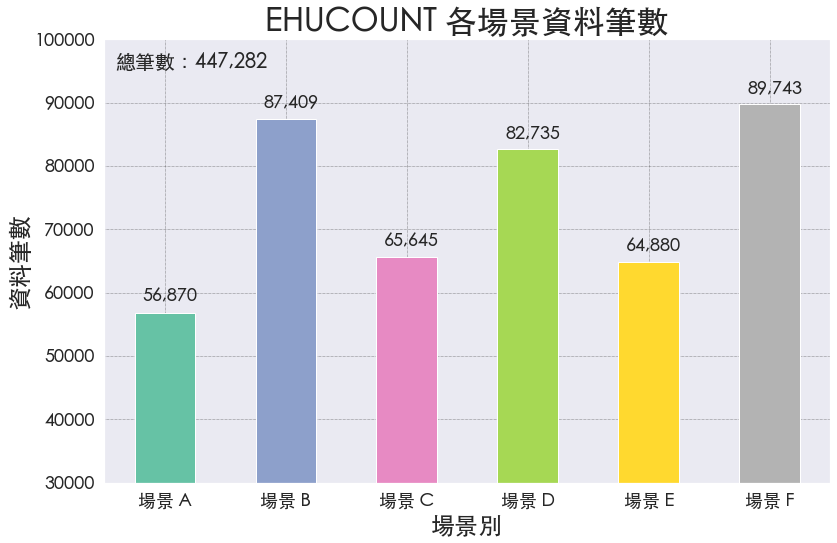

In [7]:
# 色彩
colors = plt.cm.Set2(np.linspace(.1, .9, len(df_list)))
# 填充圖樣
hatching_pattern = ['//', '\\\\', 'xx', '--', '++', 'oo', '..', '**', 'OO']
                    
xlabels=[ f'場景 {idx}' for idx in total_df.index]

     
# 繪製長條圖
ax = total_df.plot(kind='bar', 
                  figsize=(12,8), 
                  ylim=(30000,100000),
                  legend=False, color=[colors])

ax.set_xticklabels(xlabels,rotation=0)

        
plt.text(0.12, 0.95, 
         f'總筆數：{total_df["Counting"].sum():,}',
         fontsize=20,
         horizontalalignment='center',
         verticalalignment='center',
         transform = ax.transAxes)

# 繪製材質
# for i, a in enumerate(ax.patches):
#     hatch = hatching_pattern[i]
#     a.set_hatch(hatch)
    
# 標示數字
for idx, label in enumerate(list(total_df.index)): 
    for acc in total_df.columns:
        value = np.round(total_df.iloc[idx][acc])
        ax.annotate(f'{value:,}',
                    (idx, value),
                     xytext=(5, 10), 
                     textcoords='offset points',
                    ha='center',
                    fontsize=18
                   )


plt.yticks(fontsize=18)
plt.xticks(fontsize=18)
plt.ylabel('資料筆數', fontsize=24)
plt.xlabel('場景別', fontsize=24)
plt.title(f'EHUCOUNT 各場景資料筆數', fontsize=32)


plt.subplots_adjust(bottom=0.13, top=0.90, left=0.13, right=0.97, hspace=0, wspace=0)

imgName = getImageName('ScenarioRecordCounts.png')
plt.savefig(imgName)
    
plt.show()
plt.close()
                    


In [8]:
# 計算各場景、各人數類別的資料筆數

scenario_list = [str(s) for s in df_all[213].unique()]
scenario_list.sort()
crowd_list = [c for c in df_all[212].unique()]
crowd_list.sort()

crowd_df = pd.DataFrame(columns=crowd_list, index = scenario_list)

groups = df_all.iloc[:, -2:].groupby([213,212])
for idx, group in groups:
    crowd_df.loc[idx[0], idx[1]] = group.shape[0]
    
crowd_df.fillna('-', inplace=True)


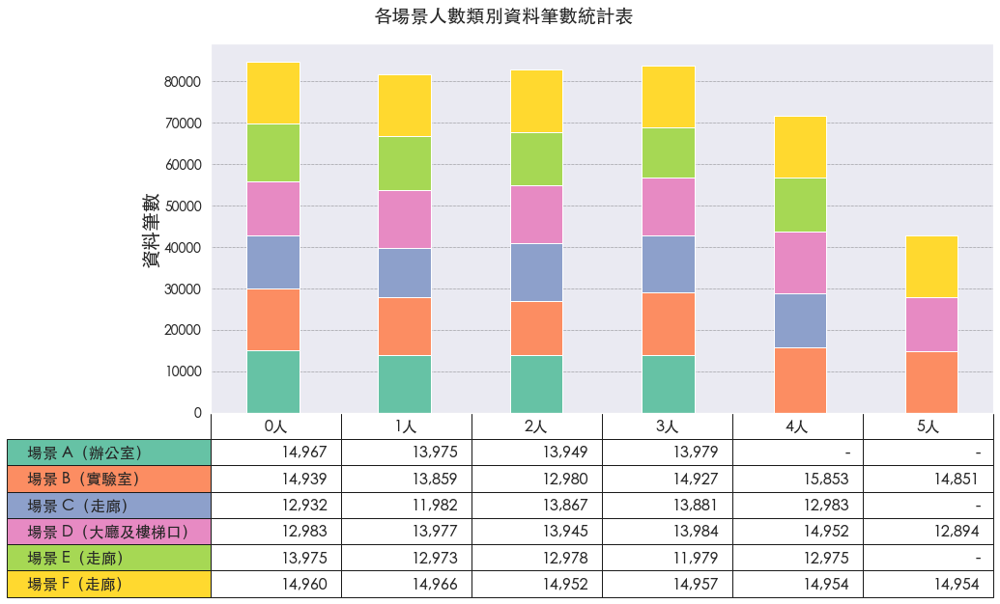

In [9]:
# 繪製各場景各人數統計表

# 填充圖樣
hatching_pattern = ['//', '\\\\', 'xx', '--', '++', 'oo', '..', '**', 'OO']

plt.figure(figsize=(15,9))

df = crowd_df.copy()
df = df.replace( '-', 0)

n_rows = df.shape[0]
colors = plt.cm.Set2(np.linspace(0, 0.7, df.shape[1]))

columns = df.index
index = np.arange(len(columns))
bar_width = 0.4
y_offset = np.zeros(len(columns))
cell_text = []
for row in range(n_rows):
#     plt.bar(index, list(df.iloc[row,:]), bar_width, bottom=y_offset, color=colors[row], hatch=hatching_pattern[row])
    plt.bar(index, list(df.iloc[row,:]), bar_width, bottom=y_offset, color=colors[row])
    y_offset = y_offset + list(df.iloc[row,:])
    cell_text.append([ '-' if data == '-' else f'{int(data):,}' for data in (crowd_df.iloc[row, :])])

plt.yticks(fontsize=14)

row_labels = ['場景 A（辦公室）', '場景 B（實驗室）', '場景 C（走廊）', '場景 D（大廳及樓梯口）', '場景 E（走廊）', '場景 F（走廊）']

table = plt.table(cellText=cell_text,
                      rowLabels=row_labels,
                      rowColours=colors,
                      colLabels=[f'{column}人' for column in crowd_df.columns],
                      bbox = [0, -0.5, 1, 0.5],
                      loc='bottom')

table.set_fontsize(16)
plt.xticks([])
plt.ylabel("資料筆數", fontsize=20)
plt.subplots_adjust(bottom=0.33, top=0.92, left=0.22, right=0.97, hspace=0.25, wspace=0.35)

plt.suptitle("各場景人數類別資料筆數統計表")
imgName = getImageName('CrowdRecordCounts.png')
plt.savefig(imgName)
plt.show()
plt.close()




In [10]:
# 整理實部資料
real_parts = []
for l in df_all.iloc[:,0:53].values.tolist():
    real_parts.extend(l)
    
# 整理虛部資料
imaginary_parts = []
for l in df_all.iloc[:,53:106].values.tolist():
    imaginary_parts.extend(l)
    
# 整理振幅資料
amplitude_parts = []
for l in df_all.iloc[:,106:159].values.tolist():
    amplitude_parts.extend(l)
    
# 整理相位資料
phase_parts = []
for l in df_all.iloc[:,159:212].values.tolist():
    phase_parts.extend(l)
    


./plot/20200331/eda/kde.png


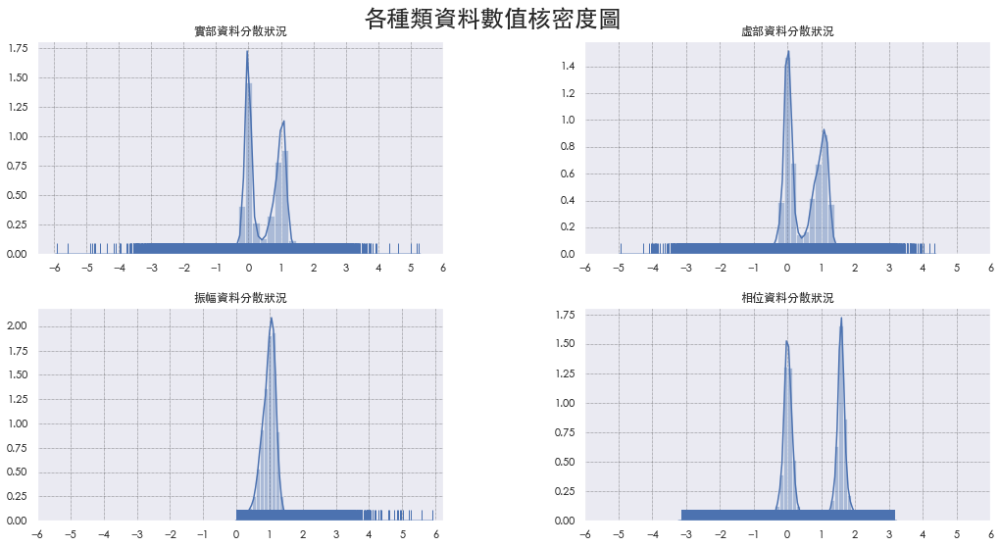

In [11]:
fig, ax = plt.subplots(2, 2, figsize=(15,8), sharex=True, sharey=True)

ax = plt.subplot(2,2,1)
sns.distplot(real_parts, rug=True, ax = ax)
ax.set_xticks([-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6])
plt.title("實部資料分散狀況")

ax = plt.subplot(2,2,2)
sns.distplot(imaginary_parts, rug=True, ax = ax)
ax.set_xticks([-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6])
plt.title("虛部資料分散狀況")

ax = plt.subplot(2,2,3)
sns.distplot(amplitude_parts, rug=True, ax = ax)
ax.set_xticks([-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6])
plt.title("振幅資料分散狀況")

ax = plt.subplot(2,2,4)
sns.distplot(phase_parts, rug=True, ax = ax)
ax.set_xticks([-6,-5,-4,-3,-2,-1,0,1,2,3,4,5,6])
plt.title("相位資料分散狀況")


plt.subplots_adjust(bottom=0.07, top=0.92, left=0.07, right=0.97, hspace=0.25, wspace=0.35)

plt.suptitle("各種類資料數值核密度圖", fontsize=24)

imgName = getImageName('kde.png')
print(imgName)
plt.savefig(imgName)
plt.show()
plt.close()



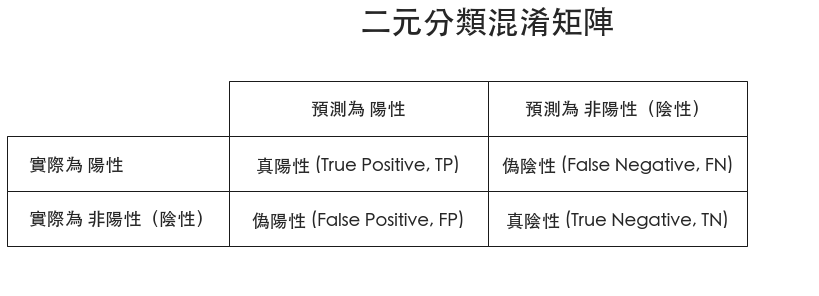

In [12]:
# 二元分類混淆矩陣

fig = plt.figure(figsize=(12,4))
# ax = fig.add_subplot(111)
ax = fig.gca()

# fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')

ax.xaxis.set_visible(False) 
ax.yaxis.set_visible(False)


col_labels = ['預測為 陽性', '預測為 非陽性（陰性）']
row_labels = ['實際為 陽性', '實際為 非陽性（陰性）']
table_vals = [['真陽性 (True Positive, TP)', '偽陰性 (False Negative, FN)'],
              ['偽陽性 (False Positive, FP)', '真陰性 (True Negative, TN)']]

# Draw table
the_table = plt.table(cellText=table_vals,
                      colWidths=[0.1] * 3,
                      rowLabels=row_labels,
                      colLabels=col_labels,
                      cellLoc='center',
                      fontsize=24,
                      loc='center')
the_table.auto_set_font_size(False)
the_table.set_fontsize(18)
the_table.scale(4,4)



# Removing ticks and spines enables you to get the figure only with table
plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
plt.tick_params(axis='y', which='both', right=False, left=False, labelleft=False)
for pos in ['right','top','bottom','left']:
    plt.gca().spines[pos].set_visible(False)


plt.subplots_adjust(bottom=0, top=0.87, left=0.25, right=1, hspace=0, wspace=0)
plt.title( "二元分類混淆矩陣", fontsize=32)
imgName = getImageName('confusion-matrix-binclass.png')
plt.savefig(imgName)

plt.show()

plt.close()

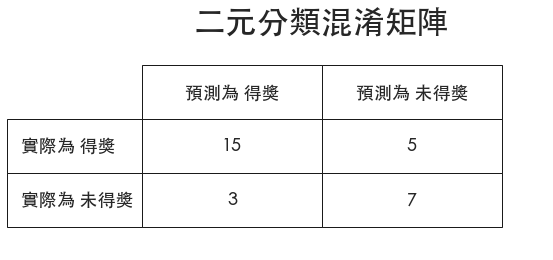

In [13]:
# 二元分類混淆矩陣範例

fig = plt.figure(figsize=(8,3.5))
# ax = fig.add_subplot(111)
ax = fig.gca()

# fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')

ax.xaxis.set_visible(False) 
ax.yaxis.set_visible(False)


col_labels = ['預測為 得獎', '預測為 未得獎']
row_labels = ['實際為 得獎', '實際為 未得獎']
table_vals = [[15, 5],
              [3, 7]]

# Draw table
the_table = plt.table(cellText=table_vals,
                      colWidths=[0.1] * 3,
                      rowLabels=row_labels,
                      colLabels=col_labels,
                      cellLoc='center',
                      fontsize=24,
                      loc='center')
the_table.auto_set_font_size(False)
the_table.set_fontsize(18)
the_table.scale(4,4)



# Removing ticks and spines enables you to get the figure only with table
plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
plt.tick_params(axis='y', which='both', right=False, left=False, labelleft=False)
for pos in ['right','top','bottom','left']:
    plt.gca().spines[pos].set_visible(False)


plt.subplots_adjust(bottom=0, top=0.85, left=0.22, right=1, hspace=0, wspace=0)
plt.title( "二元分類混淆矩陣", fontsize=32)
imgName = getImageName('confusion-matrix-binclass-with-value.png')
plt.savefig(imgName)

plt.show()

plt.close()

./plot/20200331/eda/confusion-matrix-multiclass.png


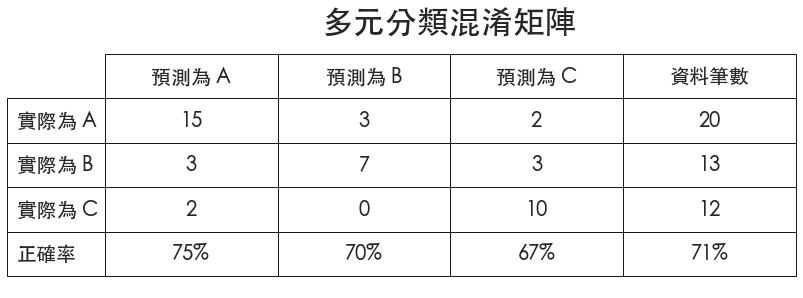

In [14]:
# 多元分類混淆矩陣

fig = plt.figure(figsize=(12,5))
ax = fig.add_subplot(111)

# fig.patch.set_visible(False)
ax.axis('off')
ax.axis('tight')

ax.xaxis.set_visible(False) 
ax.yaxis.set_visible(False)


col_labels = ['預測為 A', '預測為 B', '預測為 C', '資料筆數']
row_labels = ['實際為 A', '實際為 B', '實際為 C', '正確率']
table_vals = [['15', '3', '2', '20'],
              ['3', '7', '3', '13'],
              ['2', '0', '10', '12'],
              ['75%', '70%', '67%', '71%']]

# Draw table
the_table = plt.table(cellText=table_vals,
                      colWidths=[0.1] * 4,
                      rowLabels=row_labels,
                      colLabels=col_labels,
                      cellLoc='center',
                      loc='center'
                     )
the_table.auto_set_font_size(False)
the_table.set_fontsize(20)
the_table.scale(4,4)

# Removing ticks and spines enables you to get the figure only with table
plt.tick_params(axis='x', which='both', bottom=False, top=False, labelbottom=False)
plt.tick_params(axis='y', which='both', right=False, left=False, labelleft=False)
for pos in ['right','top','bottom','left']:
    plt.gca().spines[pos].set_visible(False)

plt.subplots_adjust(bottom=0.1, top=0.8, left=0.3, right=0.8, hspace=0.25, wspace=0.35)
plt.title( "多元分類混淆矩陣", fontsize=32)
imgName = getImageName('confusion-matrix-multiclass.png')
print(imgName)
plt.savefig(imgName)

plt.show()

plt.close()

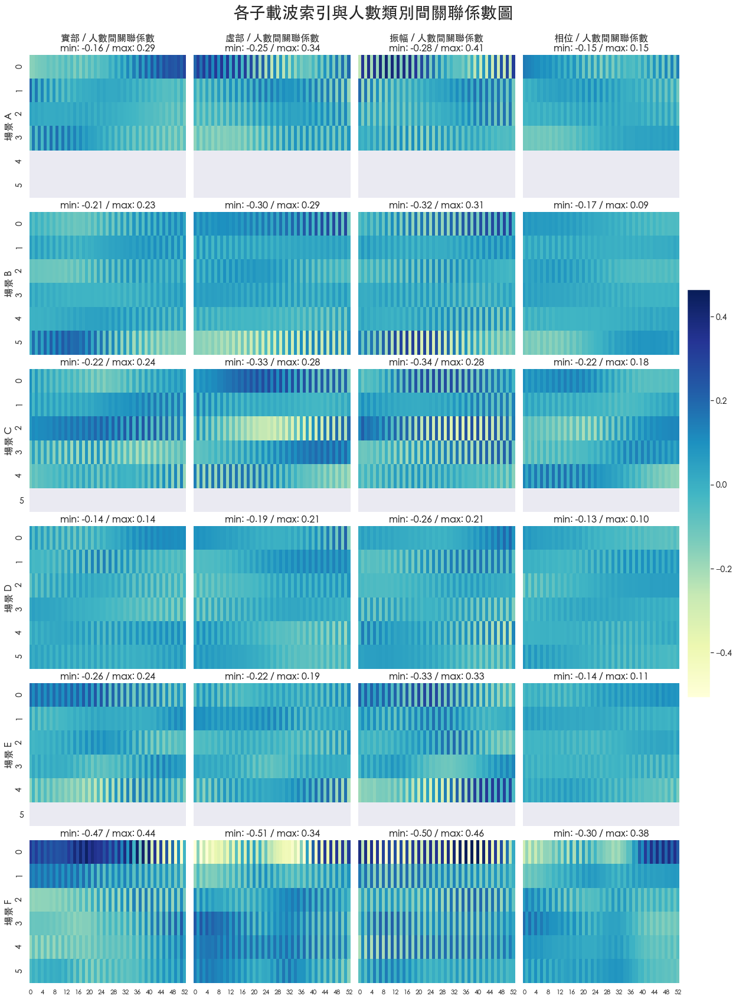

In [15]:


# 繪製子載波索引各類型資料與人數間的關聯係數

# 圖檔尺寸
(fig_width, fig_height) = ( 18, 24)    
    
# 場景列表
scenario_list = [ df.iloc[0,-1] for df in df_list ]
    
# 場景數
rows = len(scenario_list)
    
# 資料類型數
columns = 4
    
corr_min = None
corr_max = None
    
column_names = ['實部', '虛部', '振幅', '相位']
    
# 計算所有的關聯係數以取得 Max / Min 值
for scenario_idx in range(0, rows):
    scenario = df_list[scenario_idx]
    crowd_df = pd.get_dummies(scenario.iloc[:,-2], prefix='crowd')
    columns_list = list(range(0,columns))
    for data_idx in columns_list:
        data_start = data_idx * 53
        data_end = data_start + 53
        corr_df = pd.DataFrame(columns=scenario.iloc[:, data_start:data_end].columns, index=crowd_df.columns).astype(float)
        for column in corr_df.columns:
            for row in corr_df.index:
                corr_df.loc[row,column] = scenario[column].corr(crowd_df[row])
        corr_df.columns = range(0, 53)

        corr_min=min(corr_df.min()) if corr_min is None else min(corr_min, min(corr_df.min()))
        corr_max=max(corr_df.max()) if corr_max is None else max(corr_max, max(corr_df.max()))

fig, axs = plt.subplots(rows, columns, sharex=True, sharey=True,
                        gridspec_kw={'hspace': 0.1, 'wspace': 0.05}, 
                        figsize=(fig_width, fig_height))
    
sum_corr_df = pd.DataFrame(columns=columns_list, index=scenario_list)
        
cb_ax = fig.add_axes([.91, .3, .03, .4])
    
for scenario_idx in range(0, rows):
    scenario = df_list[scenario_idx]
    crowd_df = pd.get_dummies(scenario.iloc[:,-2], prefix='crowd')
    columns_list = list(range(0,columns))
    for data_idx in columns_list:
        data_start = data_idx * 53
        data_end = data_start + 53
        corr_df = pd.DataFrame(columns=scenario.iloc[:, data_start:data_end].columns, index=crowd_df.columns).astype(float)
        for column in corr_df.columns:
            for row in corr_df.index:
                corr_df.loc[row,column] = scenario[column].corr(crowd_df[row])
        corr_df.columns = range(0, 53)
        sum_corr_df.loc[scenario_list[scenario_idx], data_idx] = corr_df.abs().sum().sum()
        curr_corr_min = min(corr_df.min())
        curr_corr_max = max(corr_df.max())
            
        im = sns.heatmap(corr_df, 
                    cmap='YlGnBu', 
                    xticklabels = 4, 
                    yticklabels = [str(column).replace( 'crowd_', '' ) for column in corr_df.index], 
                    ax = axs[scenario_idx][data_idx], 
                    vmin=corr_min,
                    vmax=corr_max,
                    cbar = True,
                    cbar_ax=cb_ax)

        title = f'min: {curr_corr_min:.2f} / max: {curr_corr_max:.2f}'
        if scenario_idx == 0:
            title = f'{column_names[data_idx]} / 人數間關聯係數\n{title}'
        axs[scenario_idx][data_idx].set_title(title, fontsize=16)
            
axs[0][0].set_ylabel('場景 A', fontsize=16)
axs[1][0].set_ylabel('場景 B', fontsize=16)
axs[2][0].set_ylabel('場景 C', fontsize=16)
axs[3][0].set_ylabel('場景 D', fontsize=16)
axs[4][0].set_ylabel('場景 E', fontsize=16)
axs[5][0].set_ylabel('場景 F', fontsize=16)

for i in range(0, len(scenario_list)):
    axs[i][0].set_yticklabels(axs[i][0].get_yticklabels(), fontsize=14)

sum_corr_df.columns = column_names

cbar = fig.colorbar(im.get_children()[0], ax=axs, cax=cb_ax)
cbar.ax.tick_params(labelsize=14)
fig.suptitle('各子載波索引與人數類別間關聯係數圖', fontsize=28)
plt.subplots_adjust(bottom=0.02, top=0.93, left=0.05, right=0.90, hspace=0.25, wspace=0.35)
plt.margins(0,0)
imgName = getImageName('correlation_with_crowd.png')
plt.savefig(imgName)
plt.show()
plt.close()    
    

<Figure size 720x432 with 0 Axes>

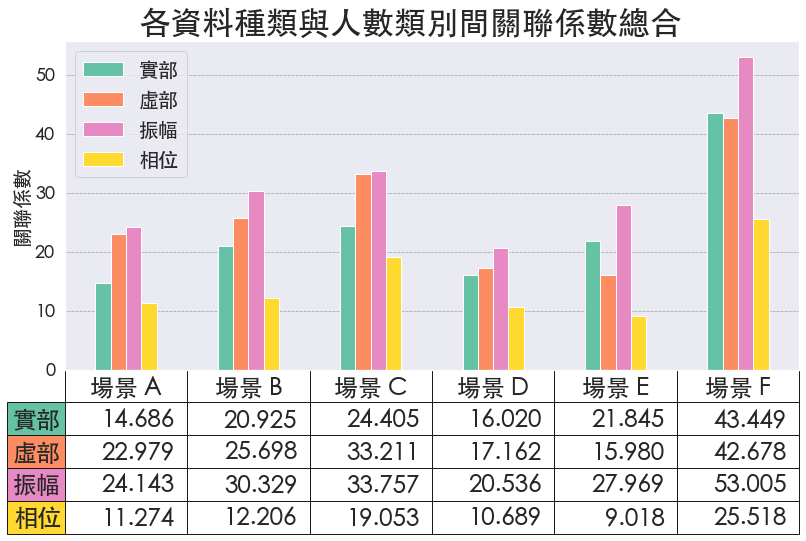

In [16]:
# 繪製各類型資料對人數的關聯係數總合


plt.figure(figsize=(10,6))
plt.rcParams['legend.fontsize'] = 20
plt.rcParams['legend.handlelength'] = 2

df = sum_corr_df.copy()
df = df.replace( '-', 0)

colors = plt.cm.Set2(np.linspace(0, 0.7, df.shape[1]))

df.plot.bar(color=colors, figsize=(12,8))

plt.yticks(fontsize=18)

cell_text = []
for row in df.columns:
    cell_text.append( [f'{data:.03f}' for data in df[row]])

table = plt.table(cellText=cell_text,
                        rowLabels=list(df.columns),
                        rowColours=colors,
                        colLabels=[f'場景 {s}' for s in df.index],
                        fontsize=16,
                        bbox = [0, -0.5, 1, 0.5],
                        loc='bottom')
table.set_fontsize(24)
plt.xticks([])
plt.ylabel("關聯係數", fontsize=20)
plt.subplots_adjust(bottom=0.35, top=0.92, left=0.1, right=0.95, hspace=0.25, wspace=0.35)

plt.suptitle("各資料種類與人數類別間關聯係數總合", fontsize=32)
imgName = getImageName('CorrelationSummary.png')
plt.savefig(imgName)


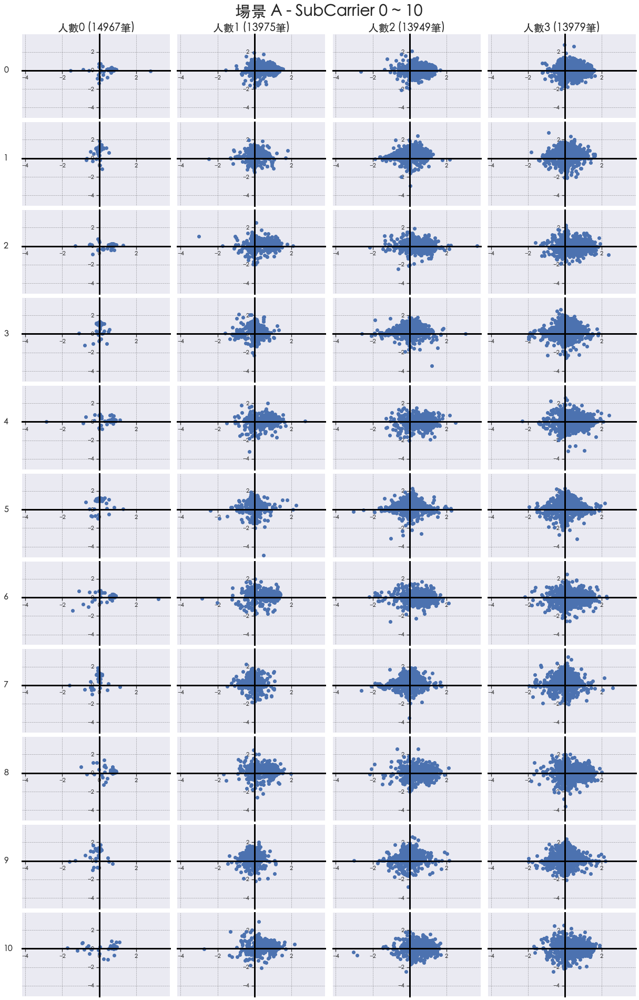

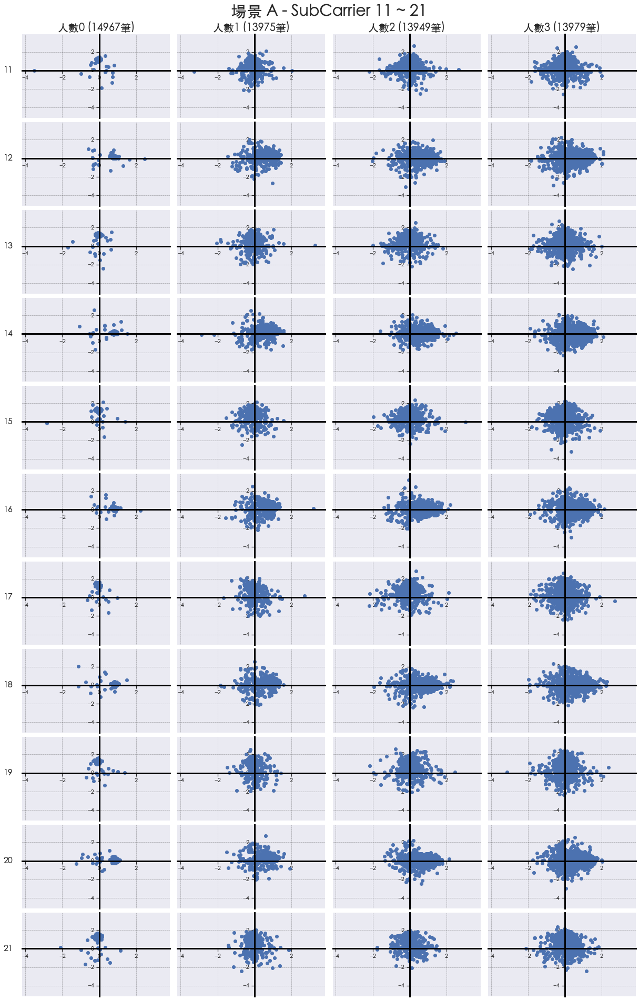

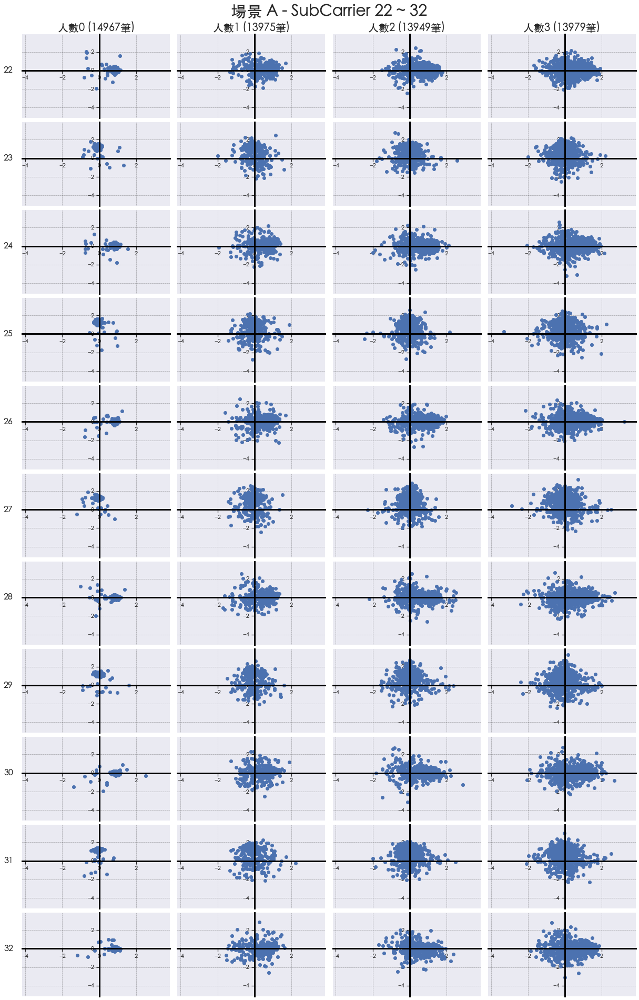

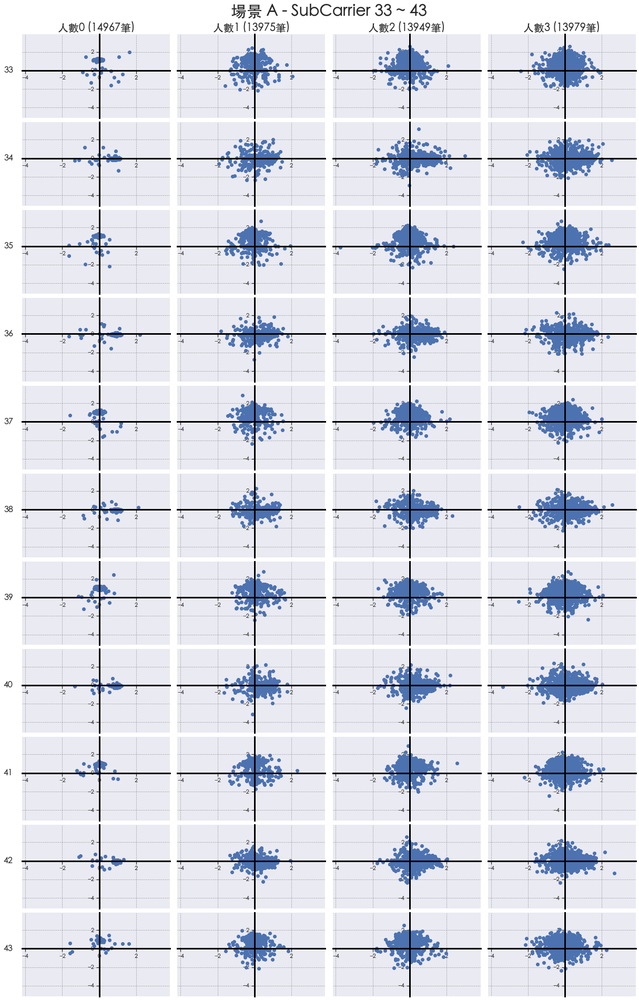

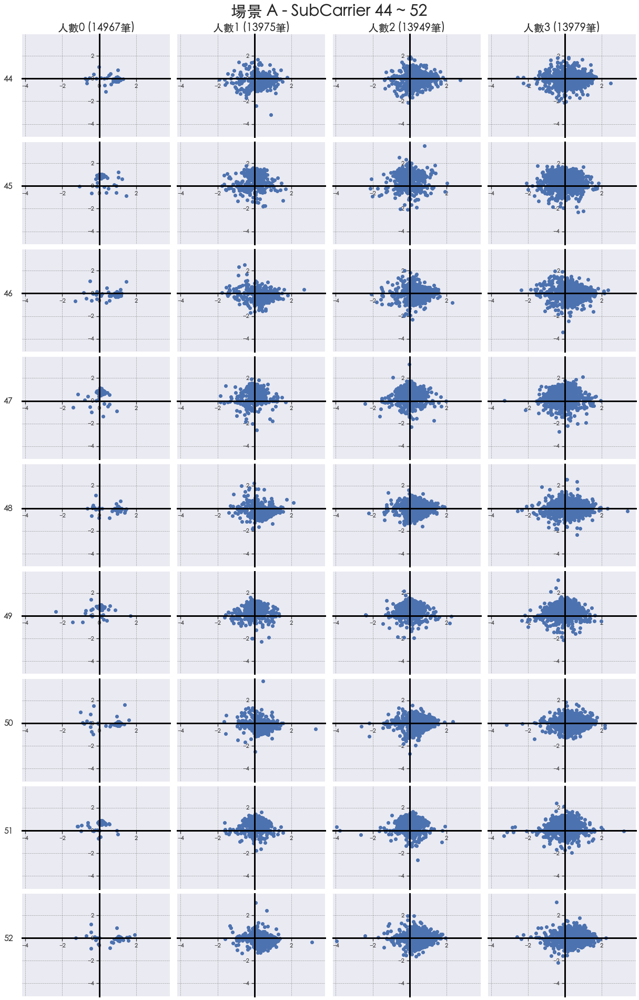

...

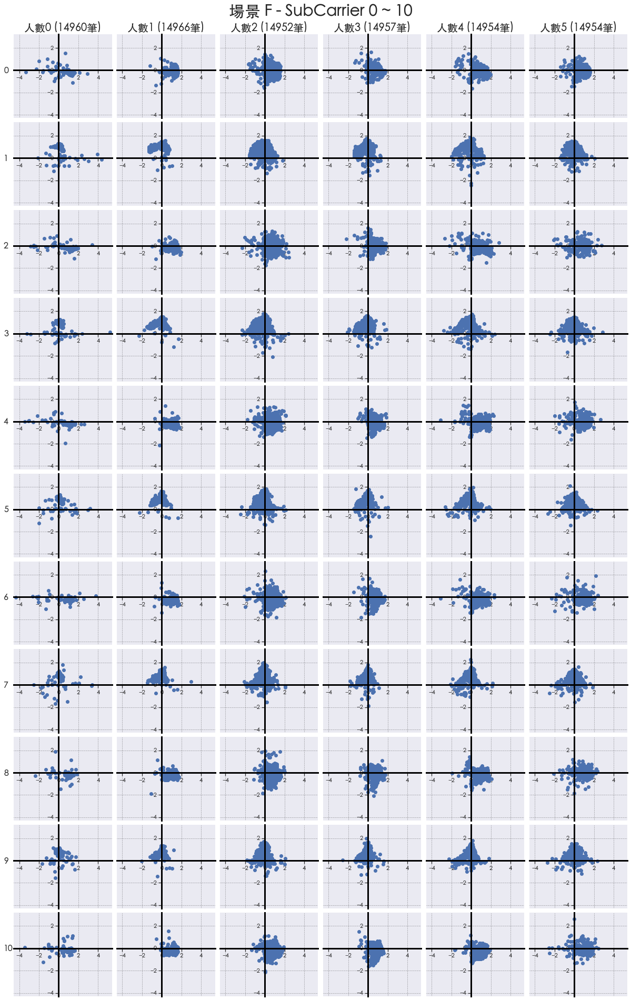

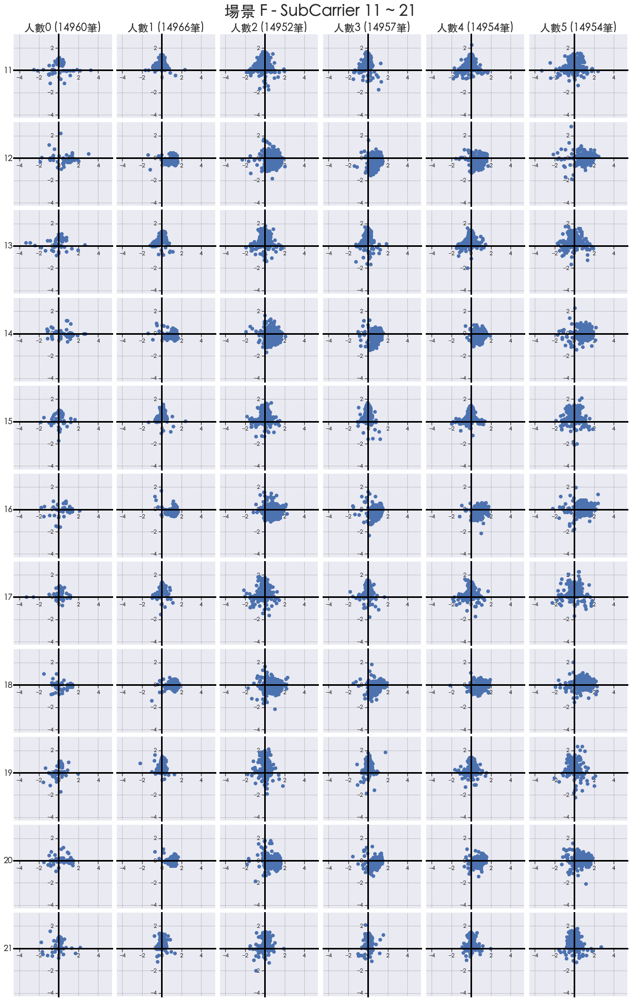

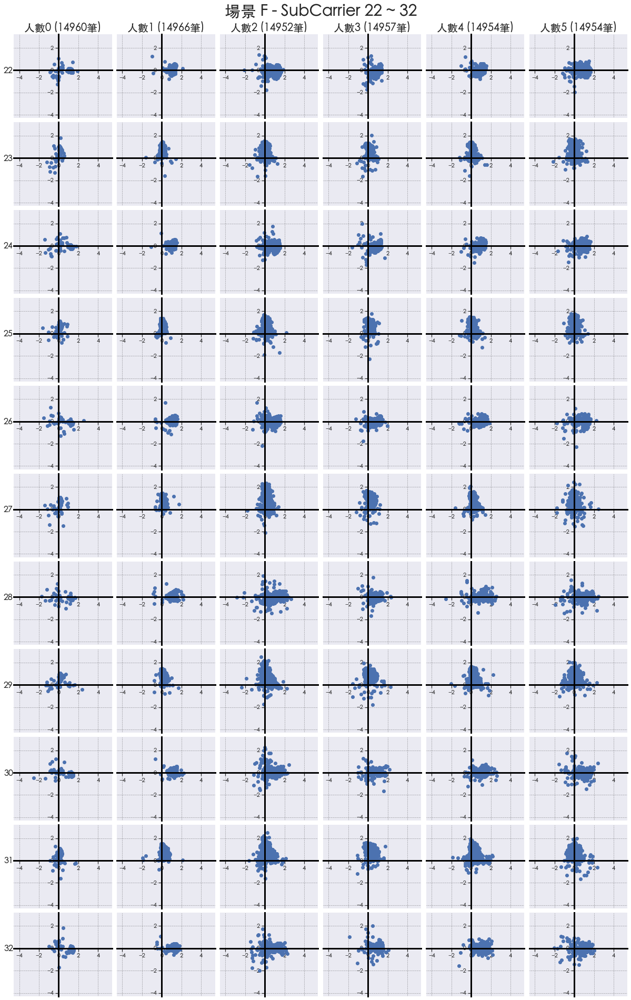

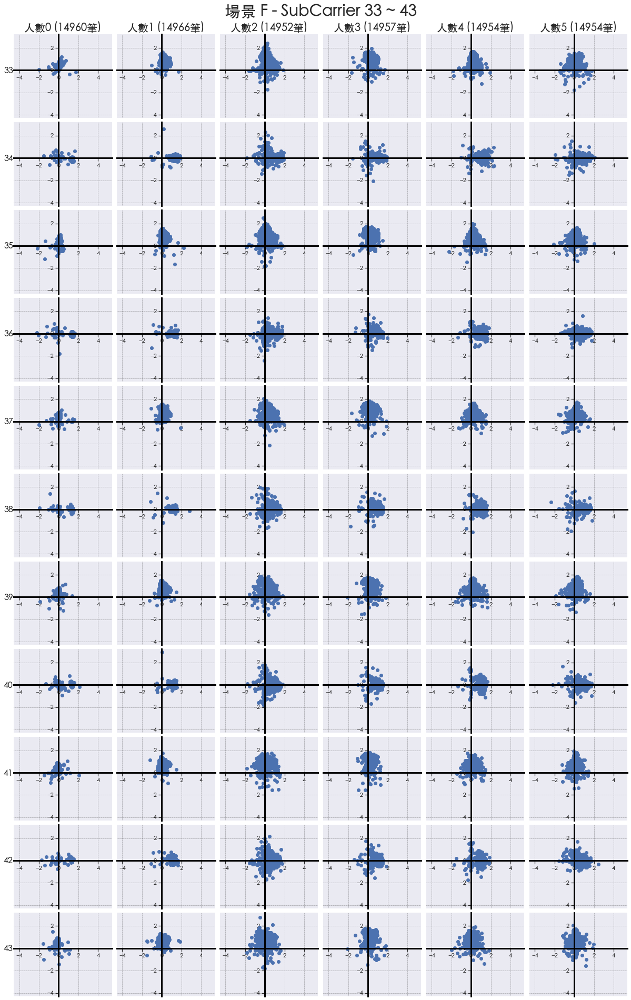

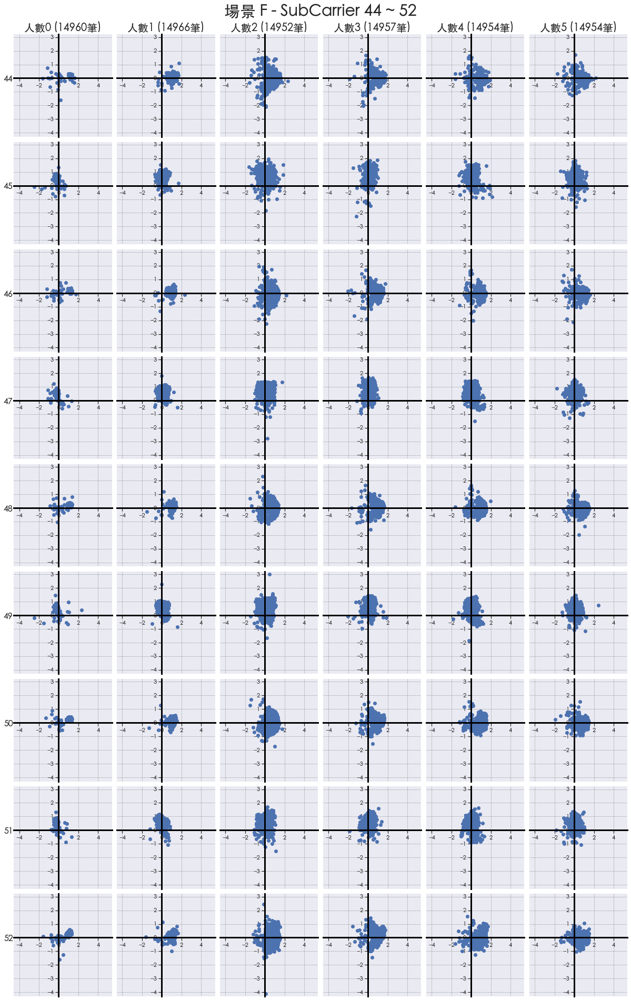

In [17]:

# 繪製 CSI 散佈圖
for df in df_list:
    
    scenario = df.iloc[0,-1]
    
    # 工作區
    workspace = os.path.join("./plot", today, plot_type_name, "scatter", f"scenario{scenario}")
    
    try:
        shutil.rmtree(workspace)
    except:
        pass

    os.makedirs(workspace)    
    
    rows = 53
    
    crowd_count = list(df.iloc[:,-2].value_counts().index)
    crowd_count.sort()
    
    columns = len(crowd_count)
        
    min_x = min(df.iloc[:,0:53].min())
    max_x = max(df.iloc[:,0:53].max())
    lim_x = [min_x-0.2, max_x+0.2]
    min_y = min(df.iloc[:,53:106].min())
    max_y = max(df.iloc[:,53:106].max())
    lim_y = [min_y-0.2, max_y+0.2]
    
    max_row_each_fig = 11
    
    fig_width = 18
    fig_height = math.ceil(fig_width / columns * max_row_each_fig) + 2
    
    
    for idx in range(0,rows):
        # 宣告圖檔格局
        if idx % max_row_each_fig == 0:
            start_idx = idx
            current_rows = max_row_each_fig if idx + max_row_each_fig < 53 else 53 - idx
            end_idx = idx + current_rows - 1
            fig_height = math.ceil(fig_width / columns * current_rows) + 2
            (fig_width, fig_height) = (18,27)
            fig, axs = plt.subplots(current_rows, columns, sharex='col', sharey=True,
                                gridspec_kw={'hspace': 0.05, 'wspace': 0.05}, figsize=(fig_width, fig_height))

        for crowd in crowd_count:
            crowd_df = df[df.iloc[:,-2] == crowd]
            x = crowd_df[idx]
            y = crowd_df[idx+53]
            if crowd == 0:
                axs[idx % max_row_each_fig][0].text(min_x - 1.2, -0.3, f'{idx}') 

            axs[idx % max_row_each_fig][crowd].set_xlim(lim_x)
            axs[idx % max_row_each_fig][crowd].set_ylim(lim_y)
            axs[idx % max_row_each_fig][crowd].scatter(x,y)
            axs[idx % max_row_each_fig][crowd].spines['top'].set_visible(False)
            axs[idx % max_row_each_fig][crowd].spines['right'].set_visible(False)
            axs[idx % max_row_each_fig][crowd].xaxis.set_ticks_position('bottom')
            axs[idx % max_row_each_fig][crowd].yaxis.set_ticks_position('left')
            axs[idx % max_row_each_fig][crowd].spines['left'].set_position(('data', 0.0))
            axs[idx % max_row_each_fig][crowd].spines['left'].set_linewidth(3)
            axs[idx % max_row_each_fig][crowd].spines['left'].set_linestyle('-')
            axs[idx % max_row_each_fig][crowd].spines['left'].set_color('black')
#             spines = axs[idx][crowd].spines['bottom']
            axs[idx % max_row_each_fig][crowd].spines['bottom'].set_position(('data', 0.0))
            axs[idx % max_row_each_fig][crowd].spines['bottom'].set_linewidth(3)
            axs[idx % max_row_each_fig][crowd].spines['bottom'].set_linestyle('-')
            axs[idx % max_row_each_fig][crowd].spines['bottom'].set_color('black')
            if idx % max_row_each_fig == 0:
                axs[idx % max_row_each_fig][crowd].set_title( f'人數{crowd} ({len(x)}筆)', fontsize=20 )

        if idx % max_row_each_fig == (max_row_each_fig - 1):            
            fig.suptitle(f"場景 {scenario} - SubCarrier {start_idx} ~ {end_idx}", fontsize=30)
            plt.margins(0,0)
            plt.subplots_adjust(bottom=0.01, top=0.95, left=0.05, right=0.95, hspace=0.25, wspace=0.35)
            imgName = getImageName(f'Scatter{scenario}-{start_idx}-{end_idx}.png')
            plt.savefig(imgName)
            plt.show()
            plt.close()
            
    fig.suptitle(f"場景 {scenario} - SubCarrier {start_idx} ~ {end_idx}", fontsize=30)
    plt.subplots_adjust(bottom=0.01, top=0.95, left=0.05, right=0.95, hspace=0.25, wspace=0.35)
    plt.margins(0,0)
    imgName = getImageName(f'Scatter{scenario}-{start_idx}-{end_idx}.png')
    plt.savefig(imgName)
    plt.show()
    plt.close()
    
    
    
     

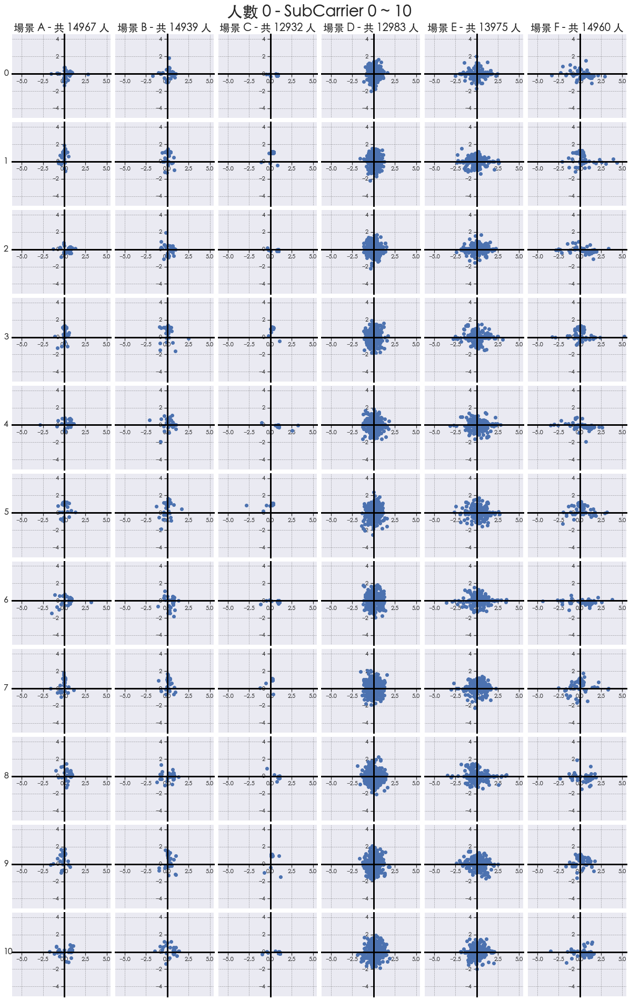

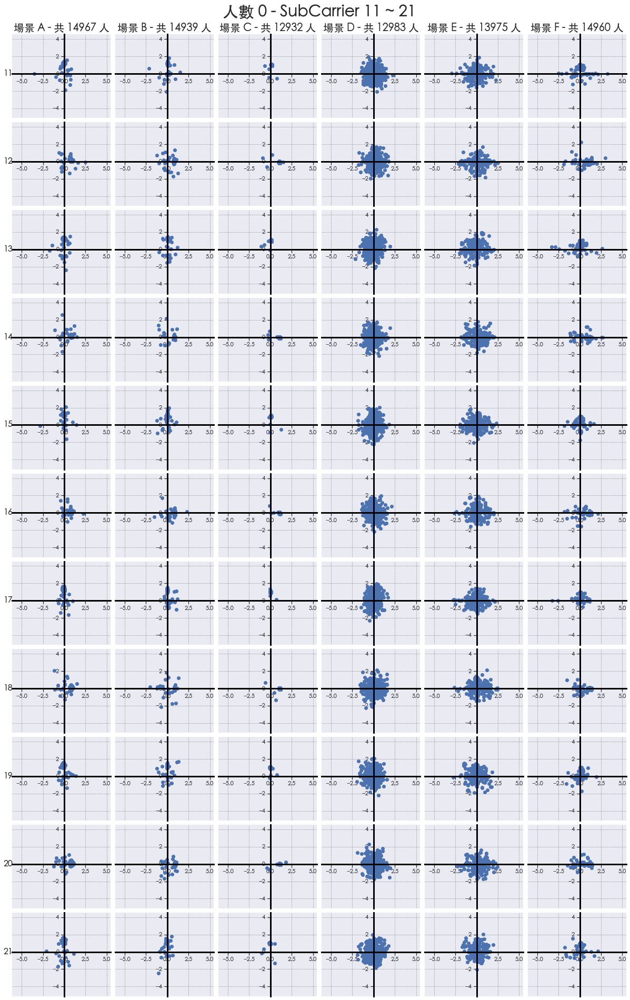

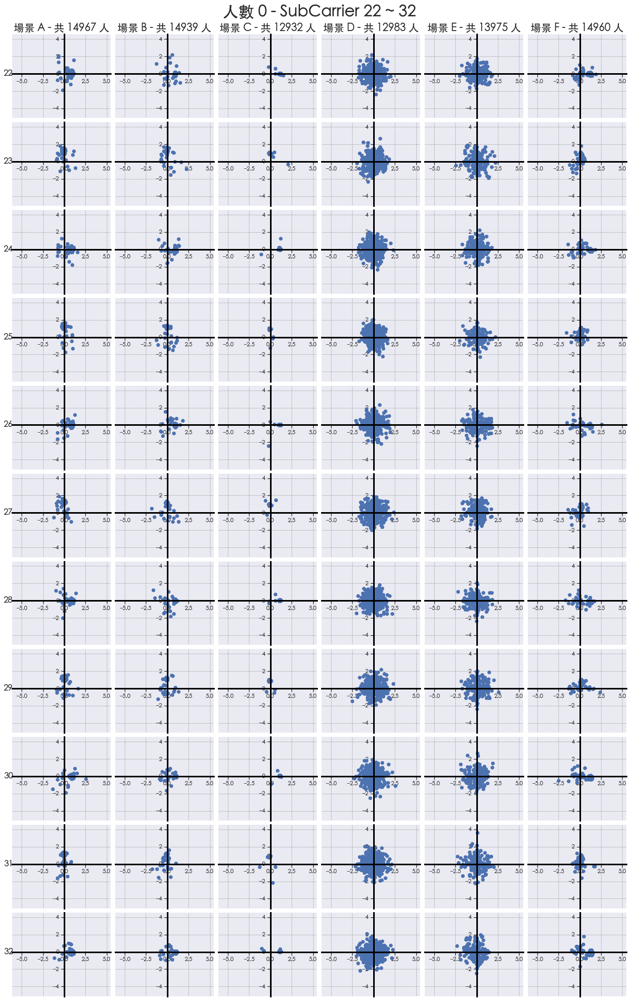

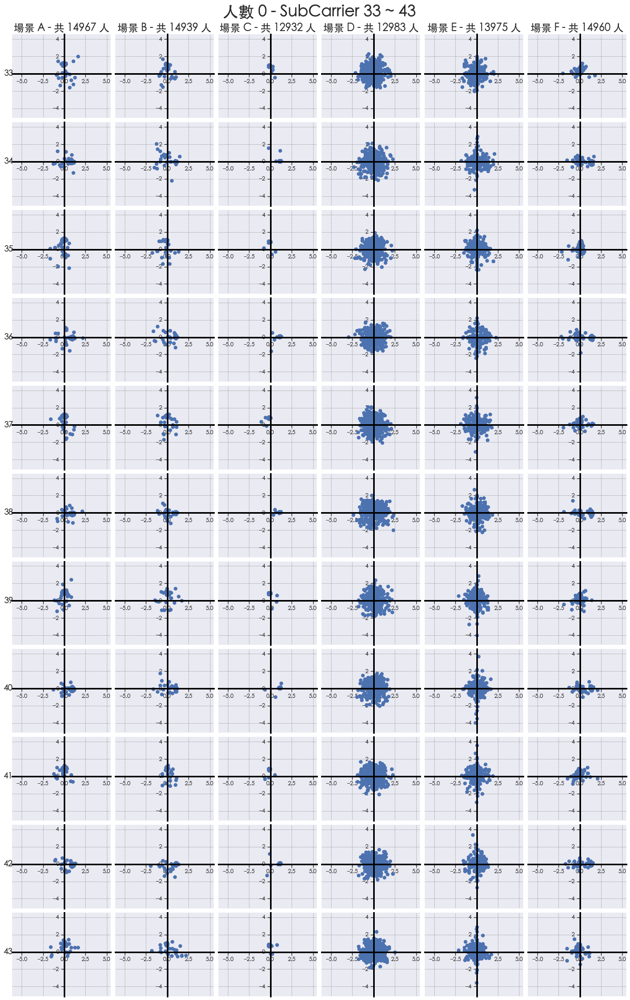

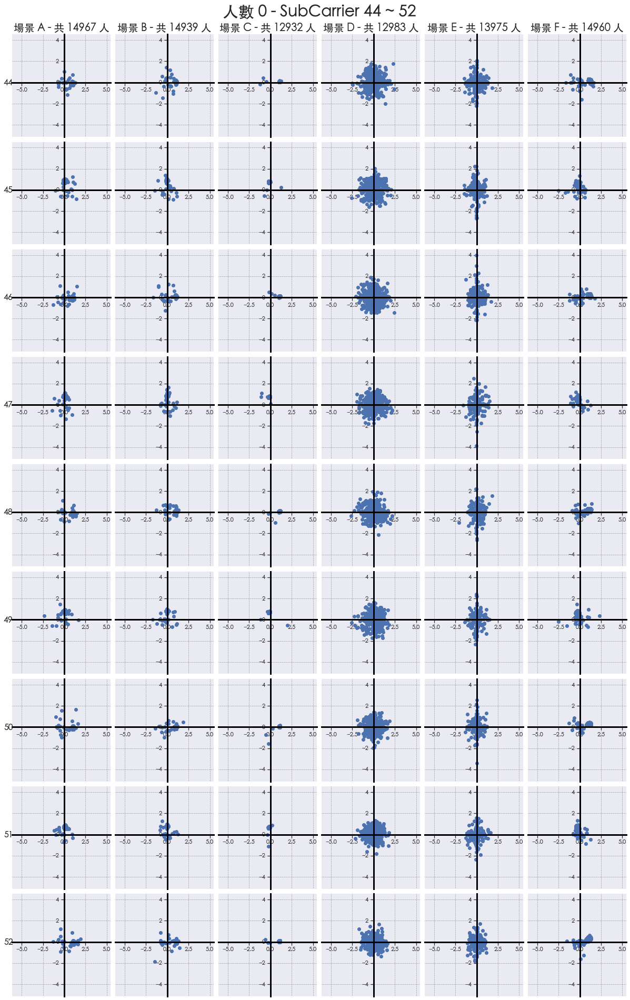

...

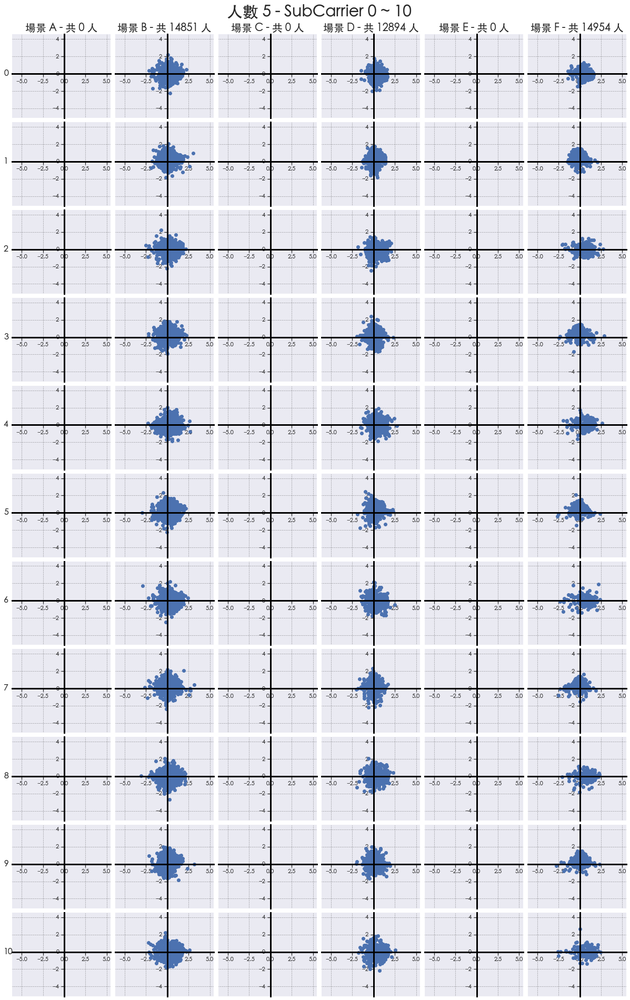

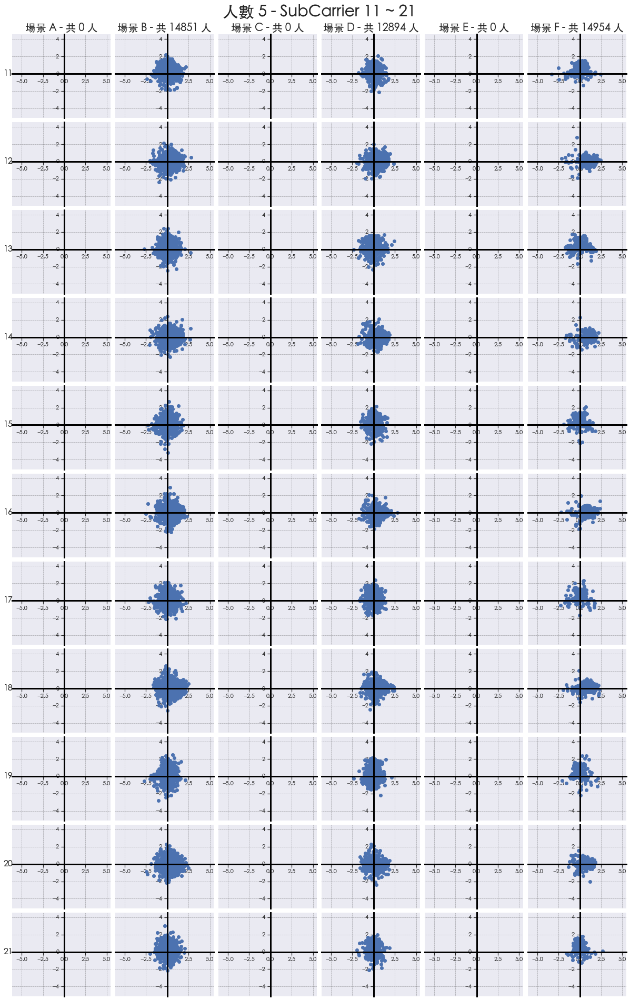

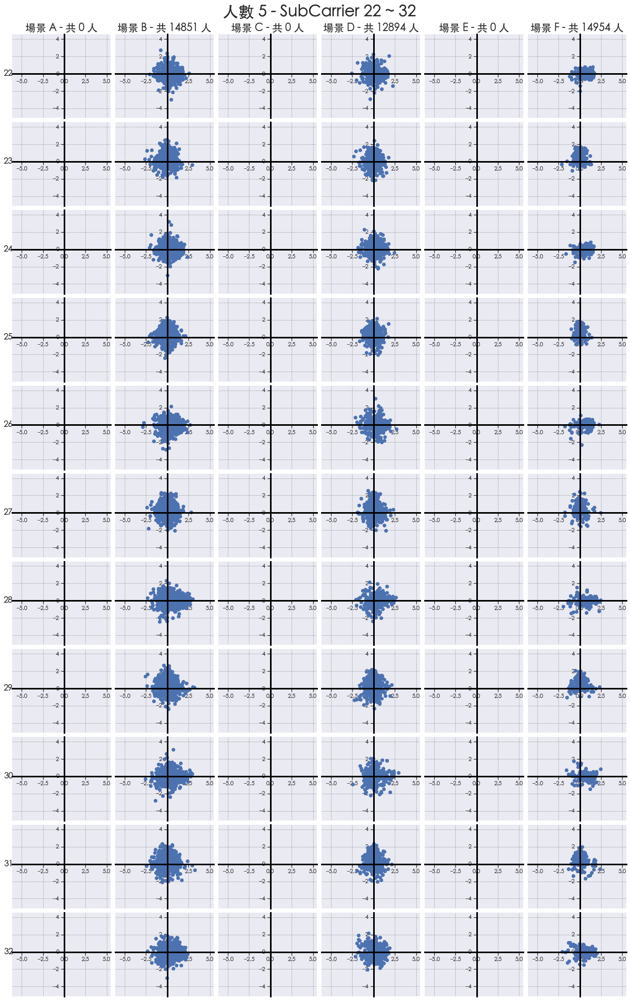

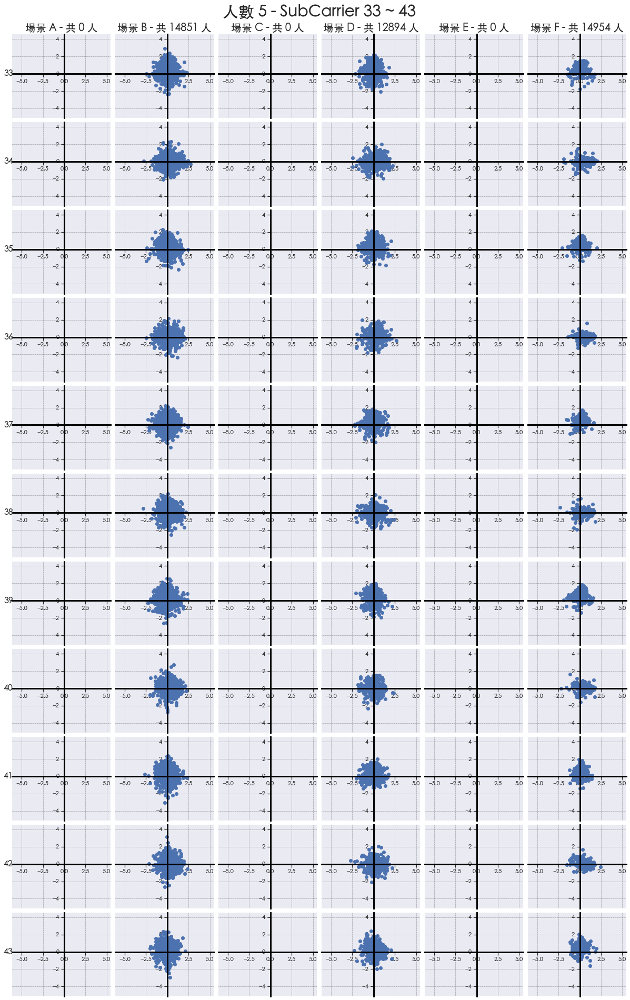

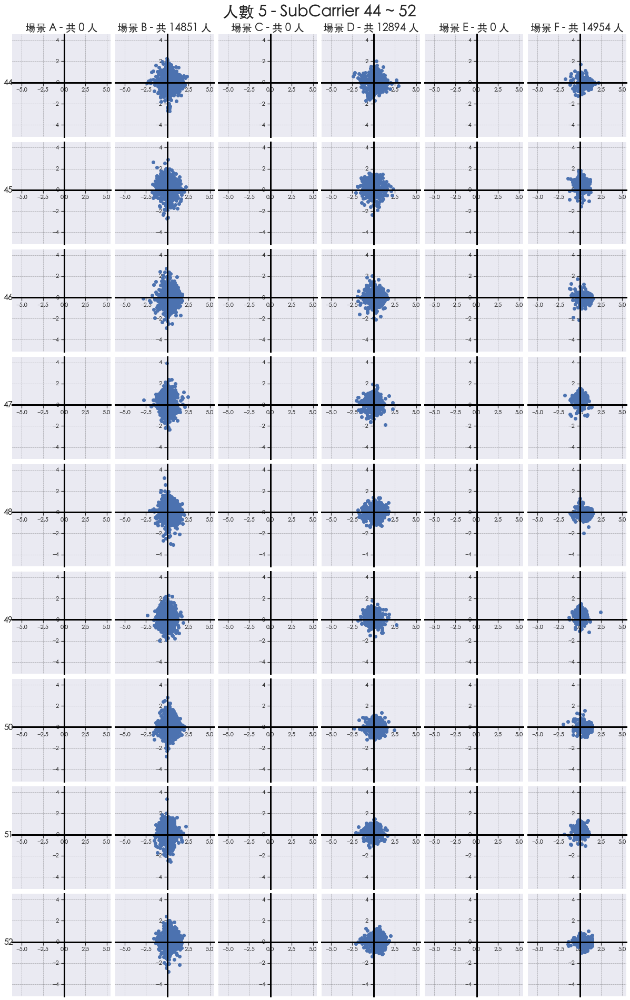

In [18]:

# 場景列表

min_x = min(df_all.iloc[:,0:53].min())
max_x = max(df_all.iloc[:,0:53].max())
lim_x = [min_x-0.2, max_x+0.2]
min_y = min(df_all.iloc[:,53:106].min())
max_y = max(df_all.iloc[:,53:106].max())
lim_y = [min_y-0.2, max_y+0.2]


# 多少個 subcarrier
rows = 53

# 多少個場景
columns = len(df_list)

# 每張圖的列數
max_row_each_fig = 11

# 每個場景的人數
scenario_list = []
for df in df_list:
    crowd_list = list(df.iloc[:,-2].value_counts().index)
    crowd_list.sort()
    scenario_list.append(crowd_list)

(fig_width, fig_height) = (18,27)

# 0 ~ 5 個人
for crowd in range(0, 6):

    # 工作區
    workspace = os.path.join("./plot", today, plot_type_name, "scatter", f"crowd{crowd}")

    try:
        shutil.rmtree(workspace)
    except:
        pass

    os.makedirs(workspace)    


    # 53 個 subcarrier
    for idx in range(0, rows):

        # 宣告圖檔格局
        if idx % max_row_each_fig == 0:
            start_idx = idx
            current_rows = max_row_each_fig if idx + max_row_each_fig < 53 else 53 - idx
            end_idx = idx + current_rows - 1
            fig, axs = plt.subplots(current_rows, columns, sharex='col', sharey=True,
                                gridspec_kw={'hspace': 0.05, 'wspace': 0.05}, figsize=(fig_width, fig_height))

        # 逐一取出場景 df
        for scenario_idx in range(len(df_list)):
            df = df_list[scenario_idx]
            # 場景
            scenario = df.iloc[0, -1]
            crowd_df = df[df.iloc[:,-2] == crowd]
            x = crowd_df.iloc[:, idx]
            y = crowd_df.iloc[:, idx+53]

            if scenario_idx == 0:
                axs[idx % max_row_each_fig][0].text(min_x - 1.2, -0.3, f'{idx}') 

            axs[idx % max_row_each_fig][scenario_idx].set_xlim(lim_x)
            axs[idx % max_row_each_fig][scenario_idx].set_ylim(lim_y)
            axs[idx % max_row_each_fig][scenario_idx].scatter(x,y)
            axs[idx % max_row_each_fig][scenario_idx].spines['top'].set_visible(False)
            axs[idx % max_row_each_fig][scenario_idx].spines['right'].set_visible(False)
            axs[idx % max_row_each_fig][scenario_idx].xaxis.set_ticks_position('bottom')
            axs[idx % max_row_each_fig][scenario_idx].yaxis.set_ticks_position('left')
            axs[idx % max_row_each_fig][scenario_idx].spines['left'].set_position(('data', 0.0))
            axs[idx % max_row_each_fig][scenario_idx].spines['left'].set_linewidth(3)
            axs[idx % max_row_each_fig][scenario_idx].spines['left'].set_linestyle('-')
            axs[idx % max_row_each_fig][scenario_idx].spines['left'].set_color('black')
            axs[idx % max_row_each_fig][scenario_idx].spines['bottom'].set_position(('data', 0.0))
            axs[idx % max_row_each_fig][scenario_idx].spines['bottom'].set_linewidth(3)
            axs[idx % max_row_each_fig][scenario_idx].spines['bottom'].set_linestyle('-')
            axs[idx % max_row_each_fig][scenario_idx].spines['bottom'].set_color('black')

            if idx % max_row_each_fig == 0:
                axs[idx % max_row_each_fig][scenario_idx].set_title( f'場景 {scenario} - 共 {crowd_df.shape[0]} 人', fontsize=20 )

        if idx % max_row_each_fig == (max_row_each_fig - 1):            
            fig.suptitle(f"人數 {crowd} - SubCarrier {start_idx} ~ {end_idx}", fontsize=30)
            plt.margins(0,0)
            plt.subplots_adjust(bottom=0.01, top=0.95, left=0.05, right=0.95, hspace=0.25, wspace=0.35)
            imgName = getImageName(f'Crowd-{crowd}-{start_idx}-{end_idx}.png')
            plt.savefig(imgName)
            plt.show()
            plt.close()

    fig.suptitle(f"人數 {crowd} - SubCarrier {start_idx} ~ {end_idx}", fontsize=30)
    plt.margins(0,0)
    plt.subplots_adjust(bottom=0.01, top=0.95, left=0.05, right=0.95, hspace=0.25, wspace=0.35)
    imgName = getImageName(f'Crowd-{crowd}-{start_idx}-{end_idx}.png')
    plt.savefig(imgName)
    plt.show()
    plt.close()

